# Improving Customer Engagement of Foursquare Users in Tokyo

## 1 - Data Wrangling

In [1]:
# FourSquare Tokyo
# Springboard Capstone Project II

%matplotlib inline
import pandas as pd
import numpy as np
import urllib.request, json
from pandas.io.json import json_normalize
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as st
import calendar
from datetime import datetime
from datetime import timedelta
from pytz import timezone
import pytz
from matplotlib import rcParams
from time import time

from sklearn.preprocessing import normalize

In [2]:
# Data obtained from Kaggle (https://www.kaggle.com/chetanism/foursquare-nyc-and-tokyo-checkin-dataset/data)
df_tokyo = pd.read_csv('dataset_TSMC2014_TKY.csv')

In [3]:
# Inspect the data
df_tokyo.info()
df_tokyo.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 573703 entries, 0 to 573702
Data columns (total 8 columns):
userId             573703 non-null int64
venueId            573703 non-null object
venueCategoryId    573703 non-null object
venueCategory      573703 non-null object
latitude           573703 non-null float64
longitude          573703 non-null float64
timezoneOffset     573703 non-null int64
utcTimestamp       573703 non-null object
dtypes: float64(2), int64(2), object(4)
memory usage: 35.0+ MB


,userId,venueId,venueCategoryId,venueCategory,latitude,longitude,timezoneOffset,utcTimestamp
0,1541,4f0fd5a8e4b03856eeb6c8cb,4bf58dd8d48988d10c951735,Cosmetics Shop,35.705101,139.619590,540,Tue Apr 03 18:17:18 +0000 2012
1,868,4b7b884ff964a5207d662fe3,4bf58dd8d48988d1d1941735,Ramen / Noodle House,35.715581,139.800317,540,Tue Apr 03 18:22:04 +0000 2012
2,114,4c16fdda96040f477cc473a5,4d954b0ea243a5684a65b473,Convenience Store,35.714542,139.480065,540,Tue Apr 03 19:12:07 +0000 2012
3,868,4c178638c2dfc928651ea869,4bf58dd8d48988d118951735,Food & Drink Shop,35.725592,139.776633,540,Tue Apr 03 19:12:13 +0000 2012
4,1458,4f568309e4b071452e447afe,4f2a210c4b9023bd5841ed28,Housing Development,35.656083,139.734046,540,Tue Apr 03 19:18:23 +0000 2012


In [4]:
# Set index to DateTime format
df_tokyo.utcTimestamp = pd.to_datetime(df_tokyo.utcTimestamp) # modify to speed up
df_tokyo = df_tokyo.set_index('utcTimestamp')
df_tokyo.index.name = None
df_tokyo.index = df_tokyo.index.tz_localize('UTC').tz_convert('Asia/Tokyo')
df_tokyo.head()

,userId,venueId,venueCategoryId,venueCategory,latitude,longitude,timezoneOffset
2012-04-04 03:17:18+09:00,1541,4f0fd5a8e4b03856eeb6c8cb,4bf58dd8d48988d10c951735,Cosmetics Shop,35.705101,139.619590,540
2012-04-04 03:22:04+09:00,868,4b7b884ff964a5207d662fe3,4bf58dd8d48988d1d1941735,Ramen / Noodle House,35.715581,139.800317,540
2012-04-04 04:12:07+09:00,114,4c16fdda96040f477cc473a5,4d954b0ea243a5684a65b473,Convenience Store,35.714542,139.480065,540
2012-04-04 04:12:13+09:00,868,4c178638c2dfc928651ea869,4bf58dd8d48988d118951735,Food & Drink Shop,35.725592,139.776633,540
2012-04-04 04:18:23+09:00,1458,4f568309e4b071452e447afe,4f2a210c4b9023bd5841ed28,Housing Development,35.656083,139.734046,540


In [5]:
# df_tokyo['timezoneOffset'] contains the same value for every observation.
# venueCategoryId is redundant. Let's remove them.

df_tokyo = df_tokyo.drop(['timezoneOffset'], 1)

In [6]:
# Let's rename the columns to make them all lowercase and shorter in length

df_tokyo = df_tokyo.rename(columns={'userId': 'userid', 'venueId': 'venueid',
                       'venueCategoryId': 'venuecatid',
                       'venueCategory': 'venuecat', 'latitude' : 'lat',
                        'longitude': 'long'
                        })

df_tokyo['day'] = df_tokyo.index.weekday
df_tokyo['hour'] = df_tokyo.index.hour

df_tokyo.head()

,userid,venueid,venuecatid,venuecat,lat,long,day,hour
2012-04-04 03:17:18+09:00,1541,4f0fd5a8e4b03856eeb6c8cb,4bf58dd8d48988d10c951735,Cosmetics Shop,35.705101,139.619590,2,3
2012-04-04 03:22:04+09:00,868,4b7b884ff964a5207d662fe3,4bf58dd8d48988d1d1941735,Ramen / Noodle House,35.715581,139.800317,2,3
2012-04-04 04:12:07+09:00,114,4c16fdda96040f477cc473a5,4d954b0ea243a5684a65b473,Convenience Store,35.714542,139.480065,2,4
2012-04-04 04:12:13+09:00,868,4c178638c2dfc928651ea869,4bf58dd8d48988d118951735,Food & Drink Shop,35.725592,139.776633,2,4
2012-04-04 04:18:23+09:00,1458,4f568309e4b071452e447afe,4f2a210c4b9023bd5841ed28,Housing Development,35.656083,139.734046,2,4


In [7]:
# Obtaining a mapping between 9 root venue categories and the 247 specific venue categories.

with urllib.request.urlopen("https://api.foursquare.com/v2/venues/categories?oauth_token=QEJ4AQPTMMNB413HGNZ5YDMJSHTOHZHMLZCAQCCLXIX41OMP&v=20170211") as url:
    data = json.loads(url.read().decode())

In [8]:
# The df_categories dataframe links a specific venue category to one of the 9 root 'maincat'

categories = range(len(data['response']['categories']))

df_categories = []
for category in categories:
    df_category = pd.DataFrame({'id': json_normalize(data['response']['categories'][category]['categories'])['id'],
                              'name': json_normalize(data['response']['categories'][category]['categories'])['name']
                                })
    df_category['category'] = json_normalize(data['response']['categories'])['name'][category]
    df_categories.append(df_category)
df_categories = pd.concat(df_categories, axis=0)

df_categories = df_categories.reset_index(drop=True)
df_categories.columns = ['venuecatid','name','maincat']

df_categories.head()

,venuecatid,name,maincat
0,56aa371be4b08b9a8d5734db,Amphitheater,Arts & Entertainment
1,4fceea171983d5d06c3e9823,Aquarium,Arts & Entertainment
2,4bf58dd8d48988d1e1931735,Arcade,Arts & Entertainment
3,4bf58dd8d48988d1e2931735,Art Gallery,Arts & Entertainment
4,4bf58dd8d48988d1e4931735,Bowling Alley,Arts & Entertainment


In [9]:
df_tokyo.head()

,userid,venueid,venuecatid,venuecat,lat,long,day,hour
2012-04-04 03:17:18+09:00,1541,4f0fd5a8e4b03856eeb6c8cb,4bf58dd8d48988d10c951735,Cosmetics Shop,35.705101,139.619590,2,3
2012-04-04 03:22:04+09:00,868,4b7b884ff964a5207d662fe3,4bf58dd8d48988d1d1941735,Ramen / Noodle House,35.715581,139.800317,2,3
2012-04-04 04:12:07+09:00,114,4c16fdda96040f477cc473a5,4d954b0ea243a5684a65b473,Convenience Store,35.714542,139.480065,2,4
2012-04-04 04:12:13+09:00,868,4c178638c2dfc928651ea869,4bf58dd8d48988d118951735,Food & Drink Shop,35.725592,139.776633,2,4
2012-04-04 04:18:23+09:00,1458,4f568309e4b071452e447afe,4f2a210c4b9023bd5841ed28,Housing Development,35.656083,139.734046,2,4


In [10]:
df_tokyo = pd.merge(df_tokyo.iloc[:,:8],df_categories[['venuecatid','maincat']],how='left',on='venuecatid').set_index(df_tokyo.index)

In [11]:
# Several venue categories were not linked to their root categories through the above merge command.
# These will need to be linked manually.

df_tokyo.loc[df_tokyo.venuecat == 'Ramen /  Noodle House','maincat'] = 'Food'
df_tokyo.loc[df_tokyo.venuecat == 'Food & Drink Shop','maincat'] = 'Shop & Service'
df_tokyo.loc[df_tokyo.venuecat == 'Airport','maincat'] = 'Travel & Transport'
df_tokyo.loc[df_tokyo.venuecat == 'Shrine','maincat'] = 'Professional & Other Places'
df_tokyo.loc[df_tokyo.venuecat == 'Mosque','maincat'] = 'Professional & Other Places'
df_tokyo.loc[df_tokyo.venuecat == 'Synagogue','maincat'] = 'Professional & Other Places'
df_tokyo.loc[df_tokyo.venuecat == 'Train Station','maincat'] = 'Travel & Transport'
df_tokyo.loc[df_tokyo.venuecat == 'Government Building','maincat'] = 'Professional & Other Places'
df_tokyo.loc[df_tokyo.venuecat == 'Shop & Service','maincat'] = 'Shop & Service'
df_tokyo.loc[df_tokyo.venuecat == 'Art Museum','maincat'] = 'Arts & Entertainment'
df_tokyo.loc[df_tokyo.venuecat == 'Gym / Fitness Center','maincat'] = 'Outdoors & Recreation'
df_tokyo.loc[df_tokyo.venuecat == 'Medical Center','maincat'] = 'Professional & Other Places'
df_tokyo.loc[df_tokyo.venuecat == 'Bar','maincat'] = 'Nightlife Spot'
df_tokyo.loc[df_tokyo.venuecat == 'Music Venue','maincat'] = 'Arts & Entertainment'
df_tokyo.loc[df_tokyo.venuecat == 'Japanese Restaurant','maincat'] = 'Food'
df_tokyo.loc[df_tokyo.venuecat == 'Chinese Restaurant','maincat'] = 'Food'
df_tokyo.loc[df_tokyo.venuecat == 'Korean Restaurant','maincat'] = 'Food'
df_tokyo.loc[df_tokyo.venuecat == 'Thai Restaurant','maincat'] = 'Food'
df_tokyo.loc[df_tokyo.venuecat == 'Spanish Restaurant','maincat'] = 'Food'
df_tokyo.loc[df_tokyo.venuecat == 'Vietnamese Restaurant','maincat'] = 'Food'
df_tokyo.loc[df_tokyo.venuecat == 'Sushi Restaurant','maincat'] = 'Food'
df_tokyo.loc[df_tokyo.venuecat == 'Dim Sum Restaurant','maincat'] = 'Food'
df_tokyo.loc[df_tokyo.venuecat == 'Brazilian Restaurant','maincat'] = 'Food'
df_tokyo.loc[df_tokyo.venuecat == 'American Restaurant','maincat'] = 'Food'
df_tokyo.loc[df_tokyo.venuecat == 'Tapas Restaurant','maincat'] = 'Food'
df_tokyo.loc[df_tokyo.venuecat == 'Ethiopian Restaurant','maincat'] = 'Food'
df_tokyo.loc[df_tokyo.venuecat == 'Taco Place','maincat'] = 'Food'
df_tokyo.loc[df_tokyo.venuecat == 'Peruvian Restaurant','maincat'] = 'Food'
df_tokyo.loc[df_tokyo.venuecat == 'Moroccan Restaurant','maincat'] = 'Food'
df_tokyo.loc[df_tokyo.venuecat == 'Cuban Restaurant','maincat'] = 'Food'
df_tokyo.loc[df_tokyo.venuecat == 'Argentinian Restaurant','maincat'] = 'Food'
df_tokyo.loc[df_tokyo.venuecat == 'Burrito Place','maincat'] = 'Food'
df_tokyo.loc[df_tokyo.venuecat == 'Arepa Restaurant','maincat'] = 'Food'
df_tokyo.loc[df_tokyo.venuecat == 'Malaysian Restaurant','maincat'] = 'Food'
df_tokyo.loc[df_tokyo.venuecat == 'South American Restaurant','maincat'] = 'Food'
df_tokyo.loc[df_tokyo.venuecat == 'College Academic Building','maincat'] = 'College & University'
df_tokyo.loc[df_tokyo.venuecat == 'History Museum','maincat'] = 'Arts & Entertainment'
df_tokyo.loc[df_tokyo.venuecat == 'Movie Theater','maincat'] = 'Arts & Entertainment'
df_tokyo.loc[df_tokyo.venuecat == 'Office','maincat'] = 'Professional & Other Places'
df_tokyo.loc[df_tokyo.venuecat == 'Temple','maincat'] = 'Professional & Other Places'
df_tokyo.loc[df_tokyo.venuecat == 'Convention Center','maincat'] = 'Professional & Other Places'
df_tokyo.loc[df_tokyo.venuecat == 'Bus Station','maincat'] = 'Travel & Transport'
df_tokyo.loc[df_tokyo.venuecat == 'Stadium','maincat'] = 'Arts & Entertainment'
df_tokyo.loc[df_tokyo.venuecat == 'High School','maincat'] = 'Professional & Other Places'
df_tokyo.loc[df_tokyo.venuecat == 'Clothing Store','maincat'] = 'Shop & Service'
df_tokyo.loc[df_tokyo.venuecat == 'Neighborhood','maincat'] = 'Outdoors & Recreation'
df_tokyo.loc[df_tokyo.venuecat == 'Food','maincat'] = 'Food'
df_tokyo.loc[df_tokyo.venuecat == 'Church','maincat'] = 'Professional & Other Places'
df_tokyo.loc[df_tokyo.venuecat == 'Outdoors & Recreation','maincat'] = 'Outdoors & Recreation'
df_tokyo.loc[df_tokyo.venuecat == 'Science Museum','maincat'] = 'Arts & Entertainment'
df_tokyo.loc[df_tokyo.venuecat == 'Hotel','maincat'] = 'Travel & Transport'
df_tokyo.loc[df_tokyo.venuecat == 'Beer Garden','maincat'] = 'Nightlife Spot'
df_tokyo.loc[df_tokyo.venuecat == 'Theater','maincat'] = 'Arts & Entertainment'
df_tokyo.loc[df_tokyo.venuecat == 'Athletic & Sport','maincat'] = 'Outdoors & Recreation'
df_tokyo.loc[df_tokyo.venuecat == 'Nursery School','maincat'] = 'Professional & Other Places'
df_tokyo.loc[df_tokyo.venuecat == 'Nightlife Spot','maincat'] = 'Nightlife Spot'
df_tokyo.loc[df_tokyo.venuecat == 'Elementary School','maincat'] = 'Professional & Other Places'
df_tokyo.loc[df_tokyo.venuecat == 'Travel & Transport','maincat'] = 'Travel & Transport'
df_tokyo.loc[df_tokyo.venuecat == 'Embassy / Consulate','maincat'] = 'Professional & Other Places'
df_tokyo.loc[df_tokyo.venuecat == 'Performing Arts Venue','maincat'] = 'Arts & Entertainment'
df_tokyo.loc[df_tokyo.venuecat == 'College Stadium','maincat'] = 'College & University'
df_tokyo.loc[df_tokyo.venuecat == 'Professional & Other Places','maincat'] = 'Professional & Other Places'
df_tokyo.loc[df_tokyo.venuecat == 'Ice Cream Shop','maincat'] = 'Food'
df_tokyo.loc[df_tokyo.venuecat == 'Cupcake Shop','maincat'] = 'Food'
df_tokyo.loc[df_tokyo.venuecat == 'Middle School','maincat'] = 'Professional & Other Places'
df_tokyo.loc[df_tokyo.venuecat == 'Music School','maincat'] = 'Professional & Other Places'
df_tokyo.loc[df_tokyo.venuecat == 'College & University','maincat'] = 'College & University'
df_tokyo.loc[df_tokyo.venuecat == 'Arts & Entertainment','maincat'] = 'Arts & Entertainment'
df_tokyo.loc[df_tokyo.venuecat == 'Planetarium','maincat'] = 'Arts & Entertainment'
df_tokyo.loc[df_tokyo.venuecat == 'Ferry','maincat'] = 'Travel & Transport'
df_tokyo.loc[df_tokyo.venuecat == 'City','maincat'] = 'Outdoors & Recreation'

In [12]:
# Now, convert the 'maincat' strings to integer labels, 0-8, for multiclass classification

df_tokyo['label'] = df_tokyo['maincat'].astype('category')
df_tokyo['label'] = df_tokyo['label'].cat.codes

In [13]:
df_tokyo.head()

,userid,venueid,venuecatid,venuecat,lat,long,day,hour,maincat,label
2012-04-04 03:17:18+09:00,1541,4f0fd5a8e4b03856eeb6c8cb,4bf58dd8d48988d10c951735,Cosmetics Shop,35.705101,139.619590,2,3,Shop & Service,7
2012-04-04 03:22:04+09:00,868,4b7b884ff964a5207d662fe3,4bf58dd8d48988d1d1941735,Ramen / Noodle House,35.715581,139.800317,2,3,Food,2
2012-04-04 04:12:07+09:00,114,4c16fdda96040f477cc473a5,4d954b0ea243a5684a65b473,Convenience Store,35.714542,139.480065,2,4,Shop & Service,7
2012-04-04 04:12:13+09:00,868,4c178638c2dfc928651ea869,4bf58dd8d48988d118951735,Food & Drink Shop,35.725592,139.776633,2,4,Shop & Service,7
2012-04-04 04:18:23+09:00,1458,4f568309e4b071452e447afe,4f2a210c4b9023bd5841ed28,Housing Development,35.656083,139.734046,2,4,Residence,6


## 2 - Exploratory Data Analysis

In [14]:
# Setup default matplotlib defaults for later use

def defaultsettings():
    rcParams.update(matplotlib.rcParamsDefault)
    sns.set_style()
    sns.set_context()
    %matplotlib inline

In [15]:
# Setup Seaborn settings for bar plots

def postersettings():
    rcParams.update(matplotlib.rcParamsDefault)
    sns.set_style("whitegrid")
    sns.set_context("poster")

In [16]:
# Define settings for plotting spatial coodinates of venues where users checked-in.

def mapsettings(x_size,y_size,dpi):
    plt.style.use('default')  # Styling
    new_style = {'grid': False} # Remove grid
    matplotlib.rc('axes', **new_style)
    rcParams['figure.figsize'] = (x_size, y_size) # Size of figure
    rcParams['figure.dpi'] = dpi
    rcParams['font.size'] = 16

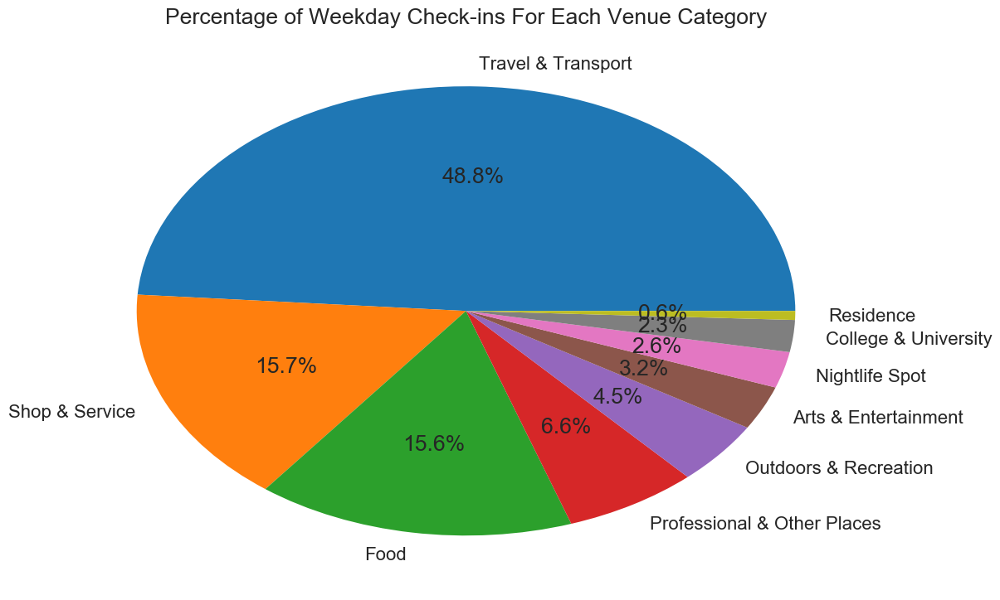

In [17]:
# Generate a pie chart to show portion of check-ins for each venue category

postersettings()

sizes_wd, sizes_we = [], []

for count in df_tokyo[df_tokyo.day < 5].maincat.value_counts():
    sizes_wd.append(count)

for count in df_tokyo[df_tokyo.day > 4].maincat.value_counts():
    sizes_we.append(count)   
    
labels = ['Travel & Transport','Shop & Service','Food','Professional & Other Places',
          'Outdoors & Recreation','Arts & Entertainment','Nightlife Spot','College & University','Residence']

plt.pie(sizes_wd, labels=labels, autopct='%1.1f%%')
plt.title('Percentage of Weekday Check-ins For Each Venue Category')
plt.show()


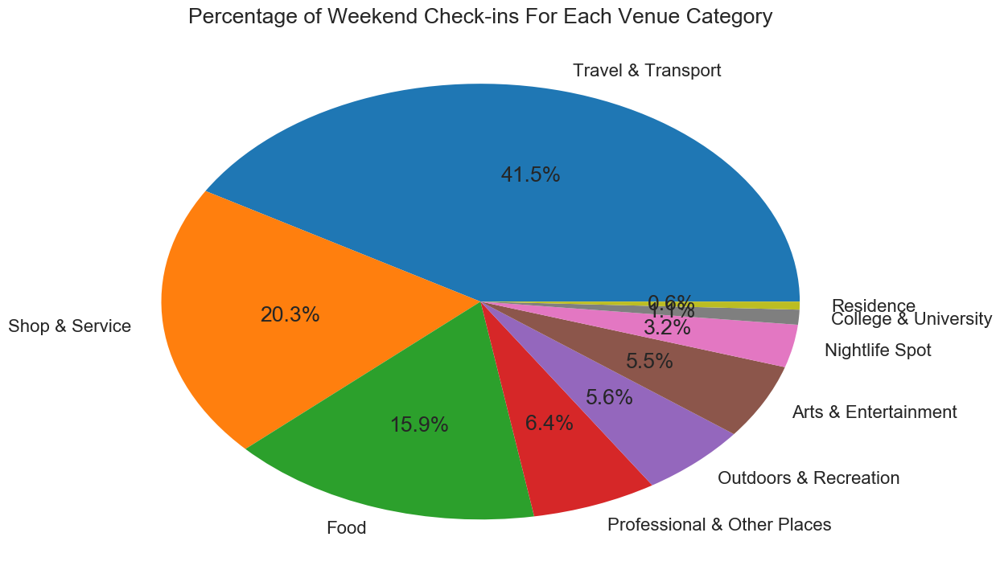

In [18]:
plt.pie(sizes_we, labels=labels, autopct='%1.1f%%')
plt.title('Percentage of Weekend Check-ins For Each Venue Category')
plt.show()

In [19]:
# Sorting venue categories by number of total check-ins.

df_tokyo.venuecat.value_counts()[:10]

Train Station            200428
Subway                    41666
Ramen /  Noodle House     17303
Convenience Store         16833
Japanese Restaurant       15680
Bar                       14940
Food & Drink Shop         14023
Electronics Store         10897
Mall                      10839
Coffee Shop                8959
Name: venuecat, dtype: int64

In [20]:
# Preparing map labels for most popular train stations in Tokyo. Rankings provided by Himasoku.

# Station names with ranking of busyness among all train stations and subways in Tokyo
station_names = ['Shinjuku (1)', 'Shibuya (2)', 'Ikebukuro (3)', 'Kita-Senju (4)',
                 'Tokyo (5)', 'Shinagawa (6)', 'Takadanobaba (7)', 'Shimbashi (8)',
                 'Akihabara (9)', 'Hibiya (10)'
                ]

station_lat = [35.6894, 35.6580, 35.7295, 35.7497, 35.6812, 35.6285, 35.7133, 35.6662,
               35.6984, 35.6744
              ]

station_long = [139.7003, 139.7016, 139.7109, 139.8053, 139.7671, 139.7388, 139.7045,
                139.7583, 139.7731, 139.7596
               ]

station_markers = pd.DataFrame({'names': station_names,
                               'lat': station_lat,
                               'long': station_long})


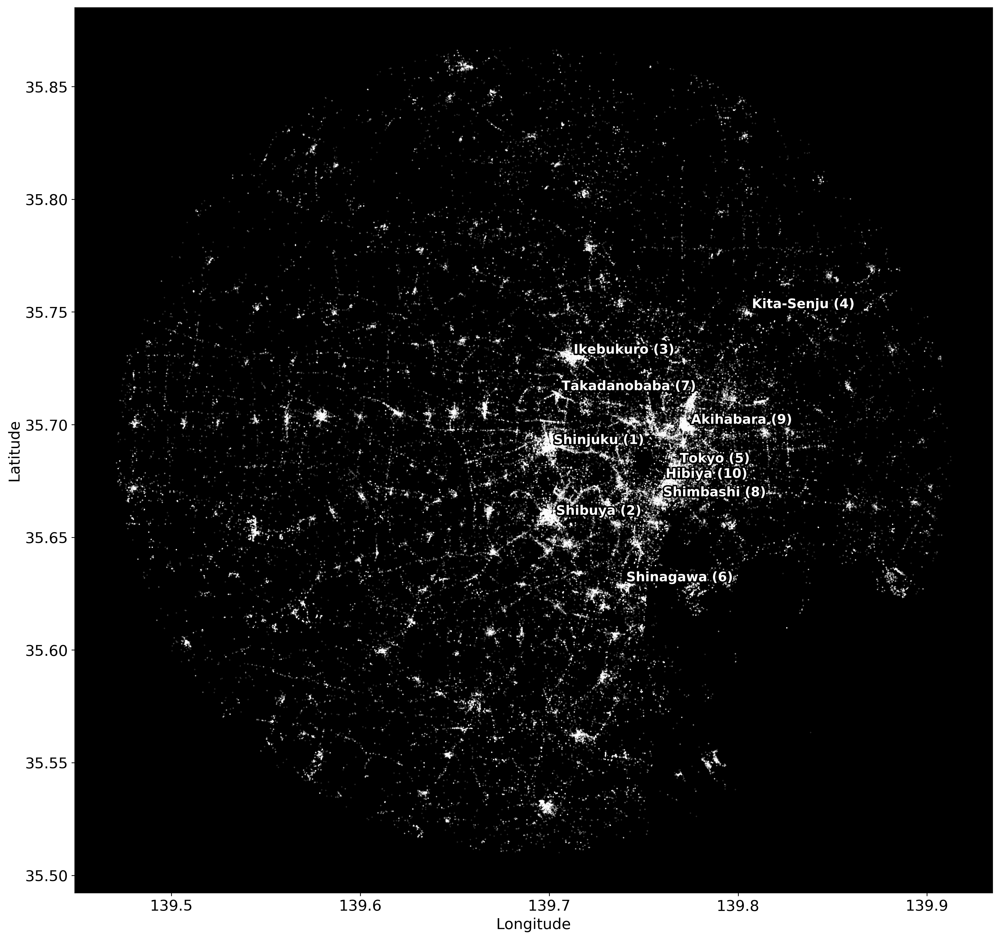

In [21]:
# Plotting coordinates of all check-ins.
import matplotlib.patheffects as PathEffects

mapsettings(17.5,17,250)
plt.figure()
ax = df_tokyo.plot(kind='scatter',x='long',y='lat',color='white',s=0.02,alpha=0.6)
ax.set_facecolor('black')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

for name, x, y in zip(station_markers.names, station_markers.long, station_markers.lat):
    txt = plt.annotate(name, xy=(x, y), xytext=(x+0.002,y+0.002), fontsize = 14, color='white', weight='heavy')
    txt.set_path_effects([PathEffects.withStroke(linewidth=3, foreground='black')])
    
plt.show()

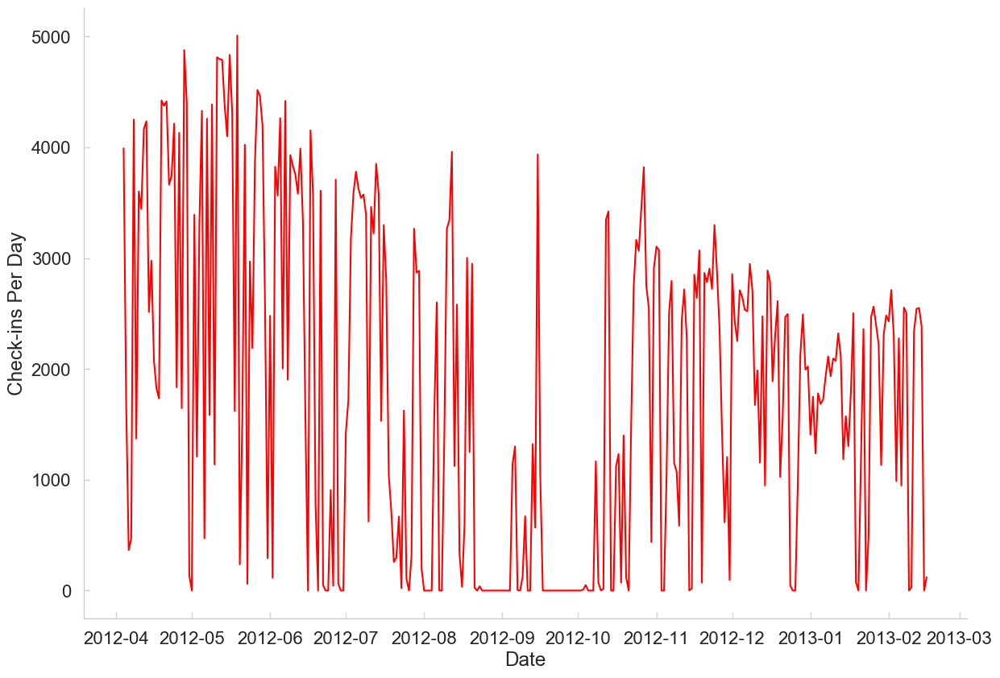

In [22]:
# Plot daily check-ins

postersettings()

daily = df_tokyo.venuecat.resample('D').count()

ax = plt.subplot(111)
ax.plot(daily.index, daily, color='red', linewidth=1.5)
ax.grid(False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

ax.tick_params(direction='in', length=6, width=1, color='lightgray')

plt.xlabel('Date')
plt.ylabel('Check-ins Per Day')
plt.tight_layout()

plt.show()


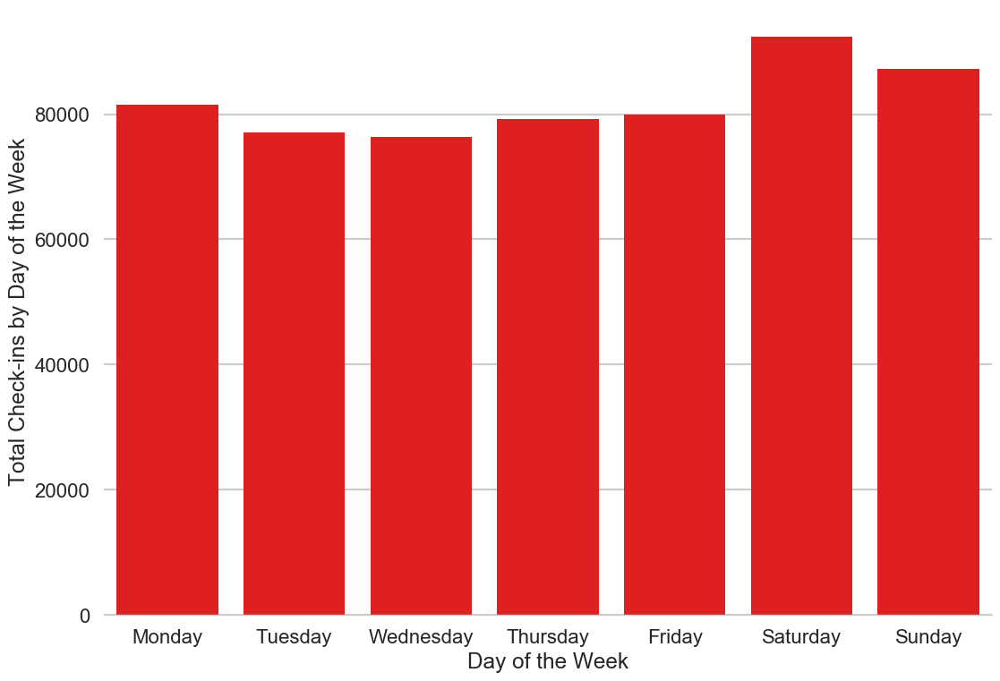

In [23]:
# Plot check-ins according to day of the week
postersettings()

plt.figure()
ax = sns.countplot(x = 'day', data = df_tokyo, color='red')
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

plt.xlabel('Day of the Week')
plt.ylabel('Total Check-ins by Day of the Week')
plt.xticks(range(0,7), calendar.day_name)
plt.show()

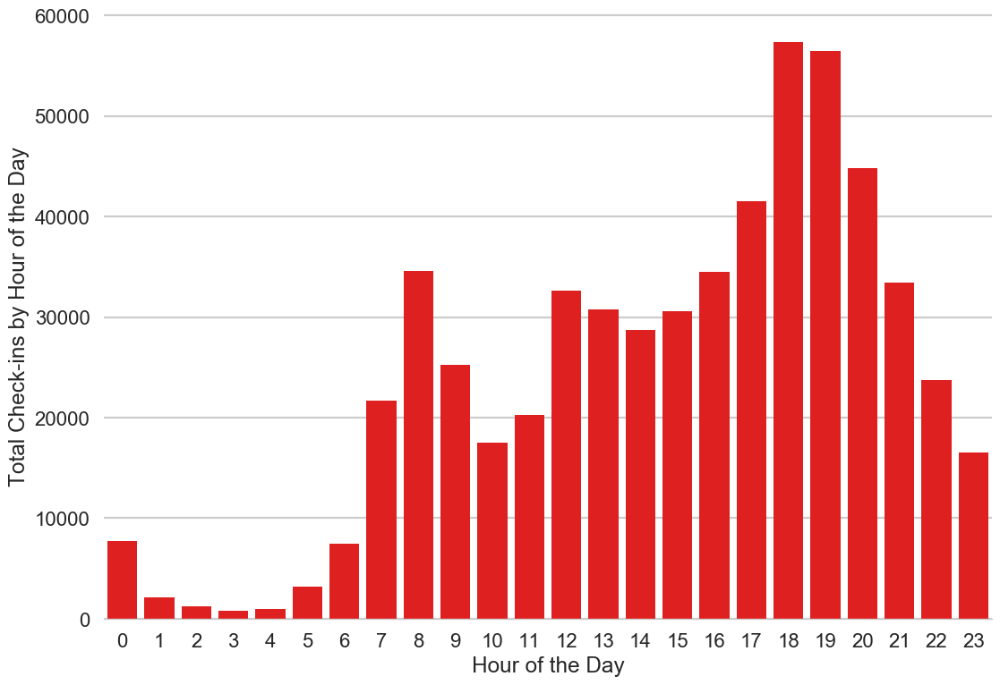

In [24]:
# Plot check-ins according to hour of the day

df_tokyo['hour'] = df_tokyo.index.hour

plt.figure()
ax = sns.countplot(x = 'hour', data = df_tokyo, color='red')
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

plt.xlabel('Hour of the Day')
plt.ylabel('Total Check-ins by Hour of the Day')
plt.show()


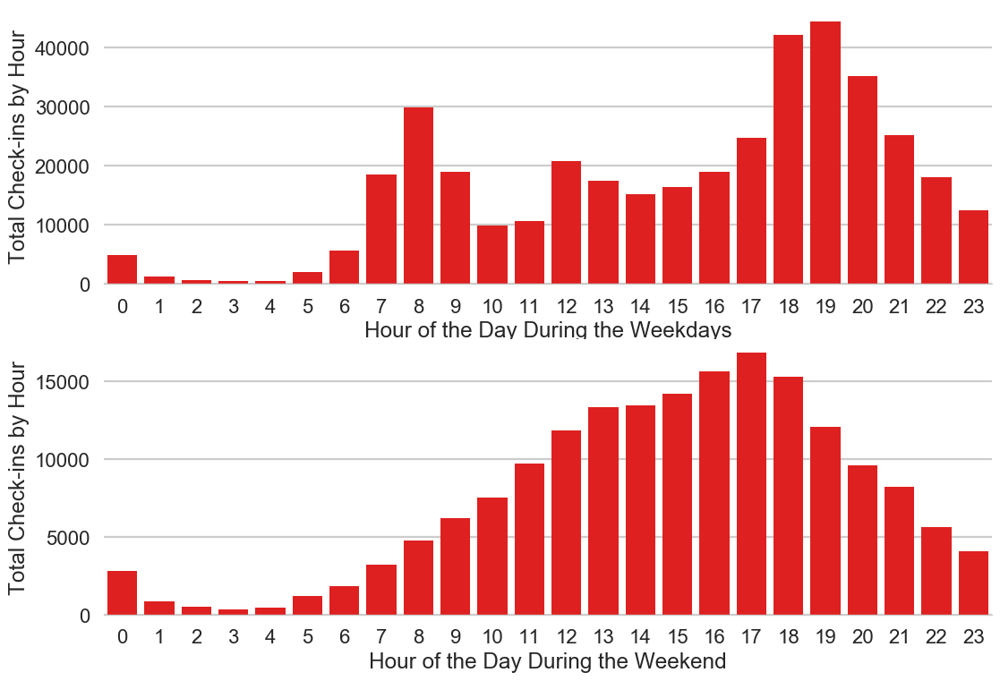

In [25]:
# Given the contrast in check-in behavior for weekdays and weekends, we plot usage for each hour of the day for
# weekdays and weekends separately.

df_tokyo_weekday = df_tokyo[df_tokyo.day < 5]
df_tokyo_weekend = df_tokyo[df_tokyo.day > 4]

plt.subplot(2,1,1)
ax = sns.countplot(x = 'hour', data = df_tokyo_weekday, color='red')
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.xlabel('Hour of the Day During the Weekdays')
plt.ylabel('Total Check-ins by Hour')

plt.subplot(2,1,2)
ax = sns.countplot(x = 'hour', data = df_tokyo_weekend, color='red')
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.xlabel('Hour of the Day During the Weekend')
plt.ylabel('Total Check-ins by Hour')

plt.show()


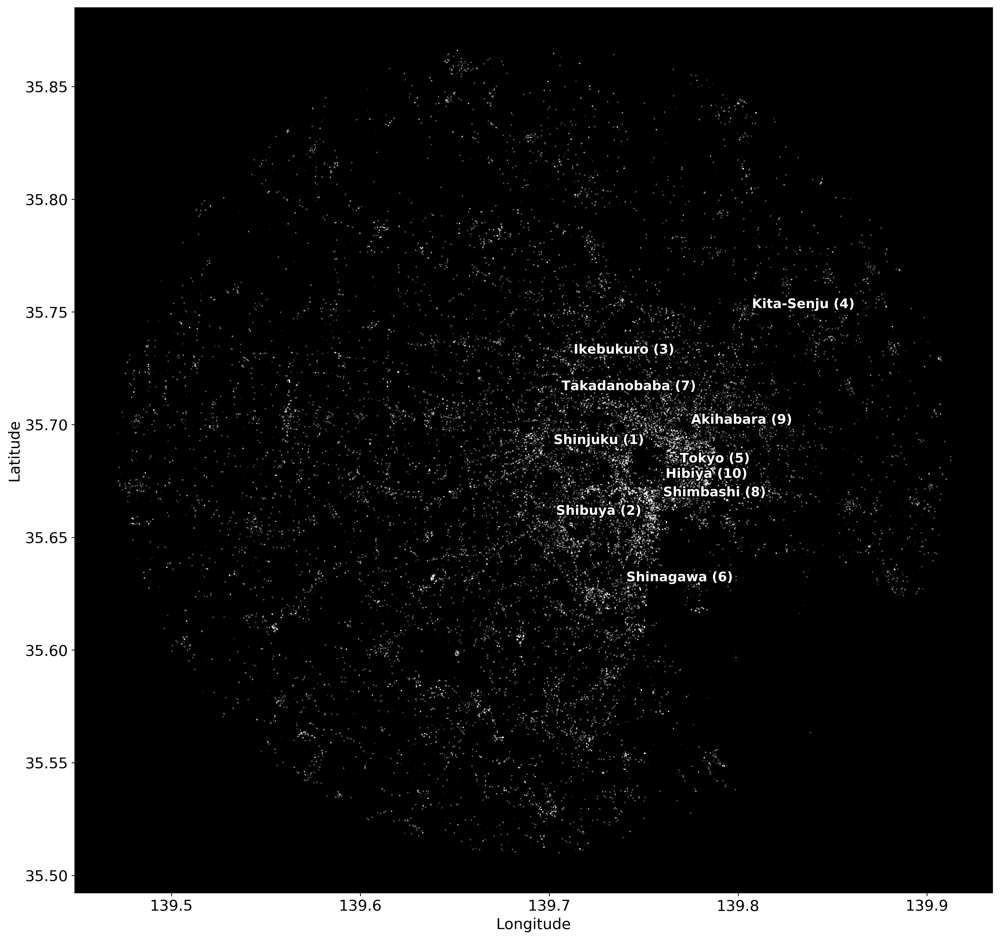

In [26]:
# Weekday venues not frequented during the weekends

mapsettings(17.5,17,250)

plt.figure()

for ii in range(2):
    plt.scatter(df_tokyo_weekday.long,df_tokyo_weekday.lat,s=0.02,alpha=1,color='white')

for ii in range(5):
    plt.scatter(df_tokyo_weekend.long,df_tokyo_weekend.lat,s=0.02,alpha=1,color='black')

for name, x, y in zip(station_markers.names, station_markers.long, station_markers.lat):
    txt = plt.annotate(name, xy=(x, y), xytext=(x+0.002,y+0.002), fontsize = 14, color='white', weight='heavy')
    txt.set_path_effects([PathEffects.withStroke(linewidth=3, foreground='black')])

plt.xlabel('Longitude')
plt.ylabel('Latitude')

ax = plt.gca()
ax.set_facecolor('black')

plt.show()

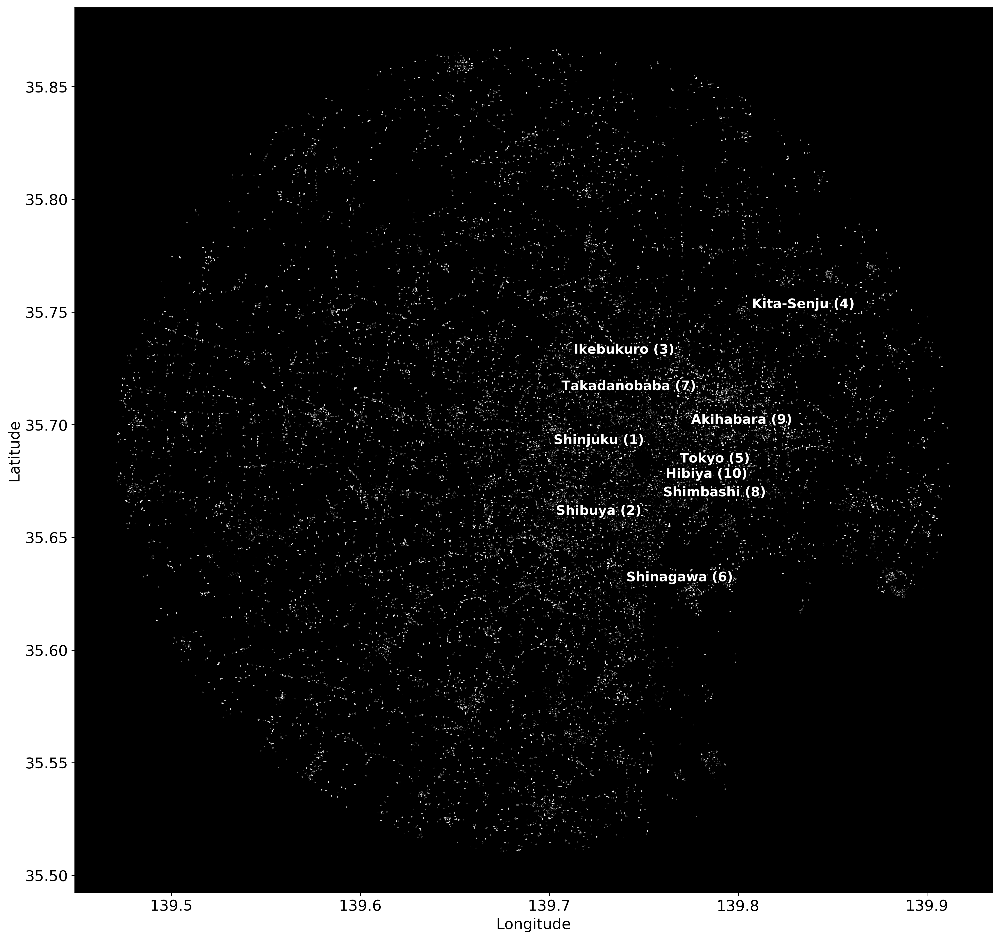

In [27]:
# Weekend venues not frequented during the weekdays

mapsettings(17.5,17,250)

plt.figure()

for ii in range(5):
    plt.scatter(df_tokyo_weekend.long,df_tokyo_weekend.lat,s=0.02,alpha=1,color='white')

for ii in range(2):
    plt.scatter(df_tokyo_weekday.long,df_tokyo_weekday.lat,s=0.02,alpha=1,color='black')

for name, x, y in zip(station_markers.names, station_markers.long, station_markers.lat):
    txt = plt.annotate(name, xy=(x, y), xytext=(x+0.002,y+0.002), fontsize = 14, color='white', weight='heavy')
    txt.set_path_effects([PathEffects.withStroke(linewidth=3, foreground='black')])

plt.xlabel('Longitude')
plt.ylabel('Latitude')

ax = plt.gca()
ax.set_facecolor('black')

plt.show()

In [28]:
# Let's now visualize user-specific check-in activity. Zooming in on Friday, May 18, 2012 for userid 718:

df_tokyo['2012-05-18'][df_tokyo['2012-05-18'].userid == 718]

,userid,venueid,venuecatid,venuecat,lat,long,day,hour,maincat,label
2012-05-18 00:00:22+09:00,718,4b72772ef964a520ac7b2de3,4bf58dd8d48988d1fd931735,Subway,35.678668,139.740171,4,0,Travel & Transport,8
2012-05-18 00:11:10+09:00,718,4b093eeff964a520e51423e3,4bf58dd8d48988d129951735,Train Station,35.658522,139.701326,4,0,Travel & Transport,8
2012-05-18 00:11:38+09:00,718,4b5586eef964a52087e627e3,4bf58dd8d48988d114951735,Bookstore,35.657786,139.703005,4,0,Shop & Service,7
2012-05-18 21:09:21+09:00,718,4cc783b073fd6dcb68ab1686,4bf58dd8d48988d1a5941735,College Academic Building,35.715239,139.751904,4,21,College & University,1
2012-05-18 22:07:26+09:00,718,4b22109df964a520944324e3,4bf58dd8d48988d1fd931735,Subway,35.708468,139.753604,4,22,Travel & Transport,8
2012-05-18 22:13:58+09:00,718,4b823278f964a520f0cc30e3,4bf58dd8d48988d1fd931735,Subway,35.695208,139.758244,4,22,Travel & Transport,8
2012-05-18 22:14:33+09:00,718,4b6e5c29f964a5201aba2ce3,4bf58dd8d48988d1fd931735,Subway,35.695933,139.758110,4,22,Travel & Transport,8
2012-05-18 22:35:21+09:00,718,4b132fd2f964a520489523e3,4bf58dd8d48988d129951735,Train Station,35.673744,139.667258,4,22,Travel & Transport,8
2012-05-18 22:56:24+09:00,718,4b2ae079f964a52061b124e3,4bf58dd8d48988d129951735,Train Station,35.651889,139.544396,4,22,Travel & Transport,8


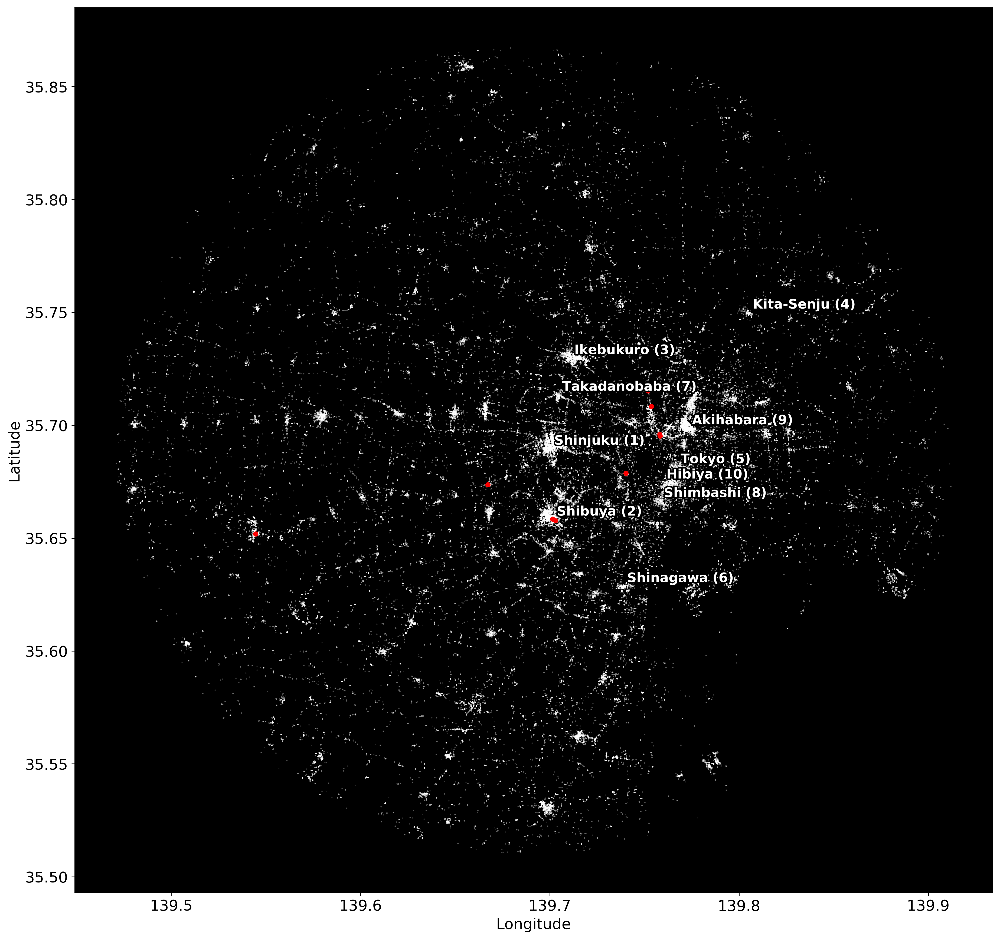

In [29]:
# Plotting check-in activity for userid = 718 on Friday, May 18, 2012. Check-ins are shown in red.

mapsettings(17.5,17,250)

plt.figure()

plt.scatter(df_tokyo_weekend.long,df_tokyo_weekend.lat,s=0.02,alpha=1,color='white')

plt.scatter(df_tokyo[df_tokyo.userid == 718]['2012-05-18'].long,df_tokyo[df_tokyo.userid == 718]['2012-05-18'].lat,s=20,alpha = 1, color='red')

for name, x, y in zip(station_markers.names, station_markers.long, station_markers.lat):
    txt = plt.annotate(name, xy=(x, y), xytext=(x+0.002,y+0.002), fontsize = 14, color='white', weight='heavy')
    txt.set_path_effects([PathEffects.withStroke(linewidth=3, foreground='black')])

plt.xlabel('Longitude')
plt.ylabel('Latitude')

ax = plt.gca()
ax.set_facecolor('black')

plt.show()

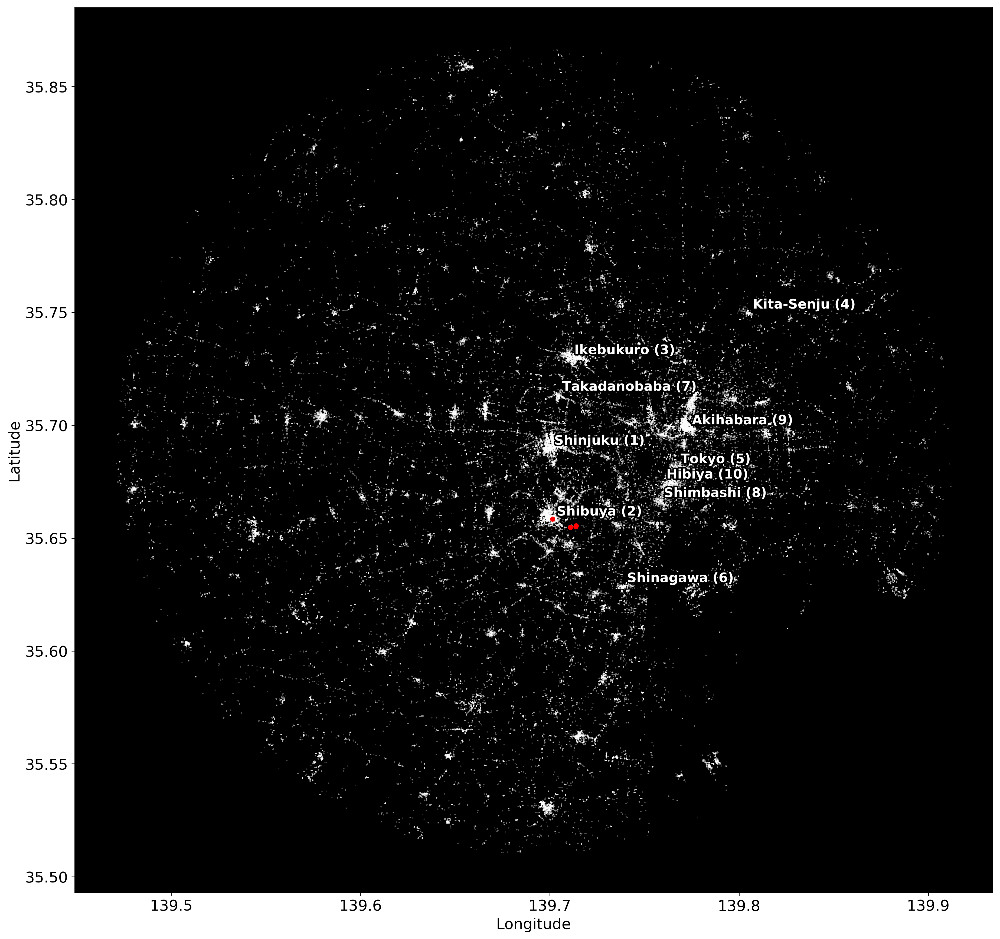

In [30]:
# Repeat the previous exercise for Saturday, May 19, 2012:

mapsettings(17.5,17,250)

plt.figure()

plt.scatter(df_tokyo_weekend.long,df_tokyo_weekend.lat,s=0.02,alpha=1,color='white')

plt.scatter(df_tokyo[df_tokyo.userid == 718]['2012-05-19'].long,df_tokyo[df_tokyo.userid == 718]['2012-05-19'].lat,s=20,alpha = 1, color='red')

for name, x, y in zip(station_markers.names, station_markers.long, station_markers.lat):
    txt = plt.annotate(name, xy=(x, y), xytext=(x+0.002,y+0.002), fontsize = 14, color='white', weight='heavy')
    txt.set_path_effects([PathEffects.withStroke(linewidth=3, foreground='black')])

plt.xlabel('Longitude')
plt.ylabel('Latitude')

ax = plt.gca()
ax.set_facecolor('black')

plt.show()

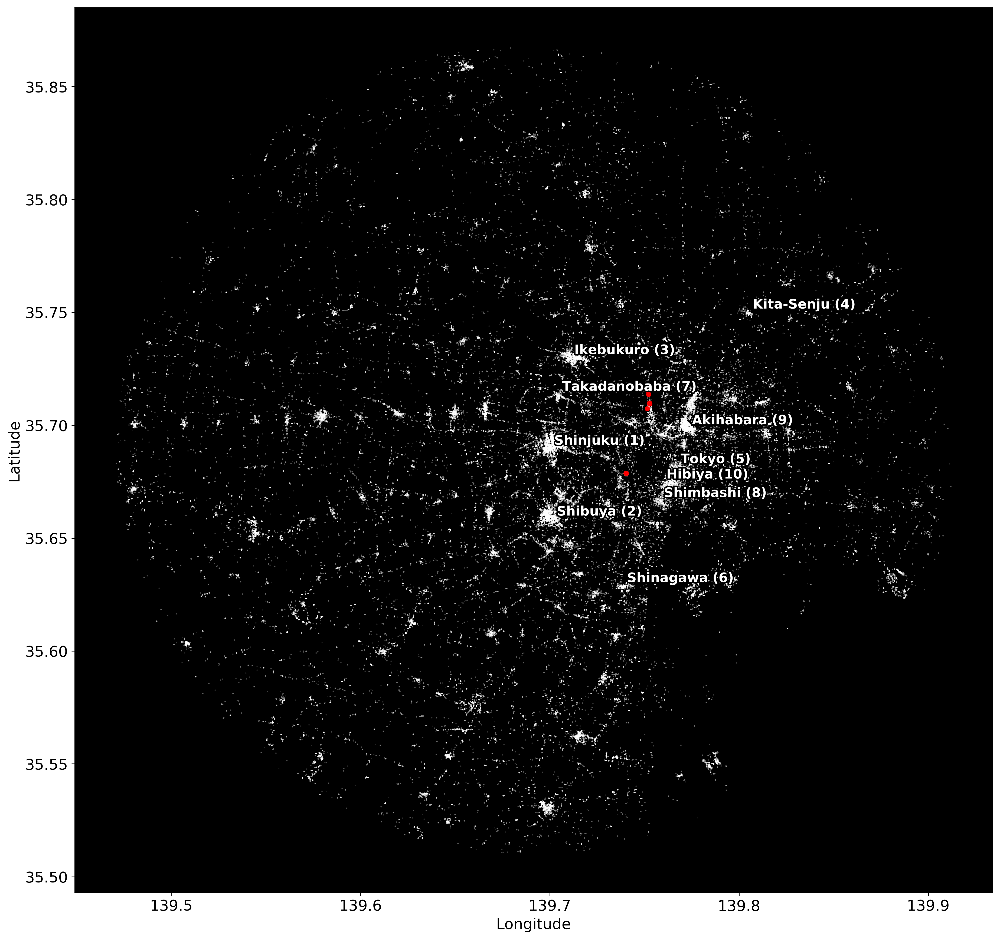

In [31]:
# Repeat the above exercise for Friday, May 25, 2012:

mapsettings(17.5,17,250)

plt.figure()

plt.scatter(df_tokyo_weekend.long,df_tokyo_weekend.lat,s=0.02,alpha=1,color='white')

plt.scatter(df_tokyo[df_tokyo.userid == 718]['2012-05-25'].long,df_tokyo[df_tokyo.userid == 718]['2012-05-25'].lat,s=20,alpha = 1, color='red')

for name, x, y in zip(station_markers.names, station_markers.long, station_markers.lat):
    txt = plt.annotate(name, xy=(x, y), xytext=(x+0.002,y+0.002), fontsize = 14, color='white', weight='heavy')
    txt.set_path_effects([PathEffects.withStroke(linewidth=3, foreground='black')])

plt.xlabel('Longitude')
plt.ylabel('Latitude')

ax = plt.gca()
ax.set_facecolor('black')

plt.show()

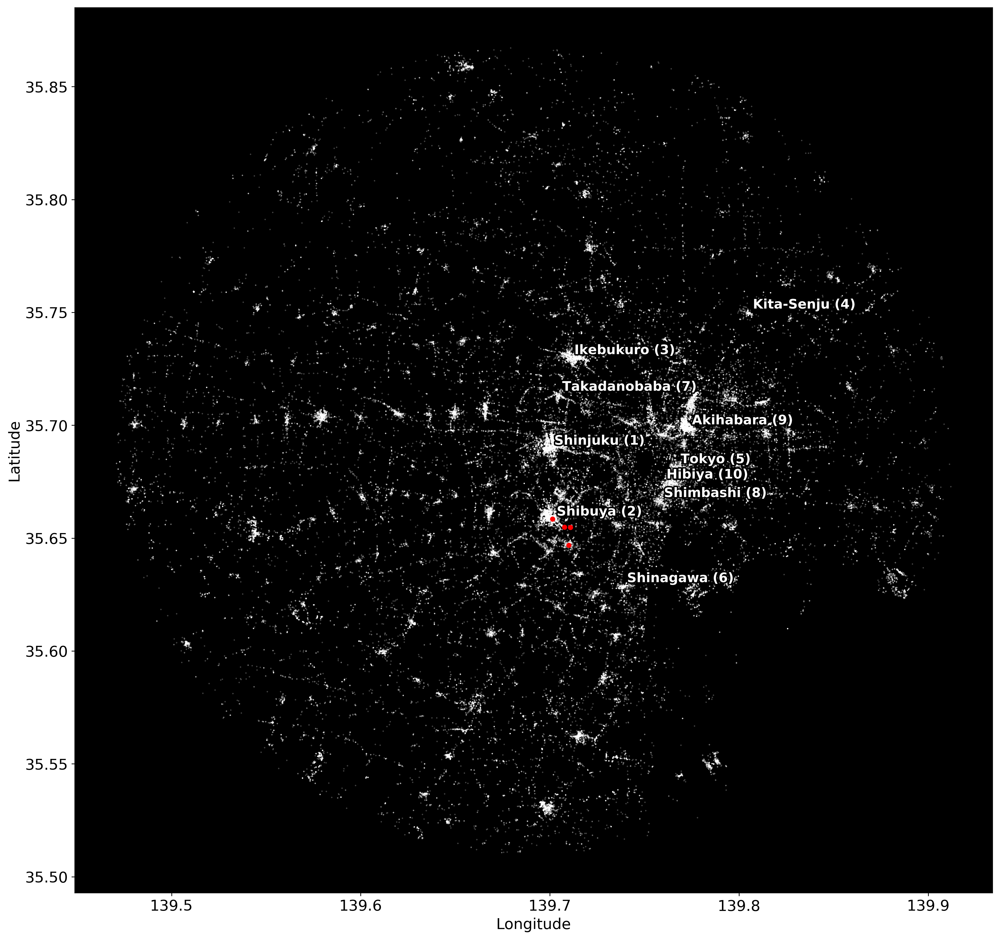

In [32]:
# Repeat the above exercise for Saturday, May 26, 2012:

mapsettings(17.5,17,250)

plt.figure()

plt.scatter(df_tokyo_weekend.long,df_tokyo_weekend.lat,s=0.02,alpha=1,color='white')

plt.scatter(df_tokyo[df_tokyo.userid == 718]['2012-05-26'].long,df_tokyo[df_tokyo.userid == 718]['2012-05-26'].lat,s=20,alpha = 1, color='red')

for name, x, y in zip(station_markers.names, station_markers.long, station_markers.lat):
    txt = plt.annotate(name, xy=(x, y), xytext=(x+0.002,y+0.002), fontsize = 14, color='white', weight='heavy')
    txt.set_path_effects([PathEffects.withStroke(linewidth=3, foreground='black')])

plt.xlabel('Longitude')
plt.ylabel('Latitude')

ax = plt.gca()
ax.set_facecolor('black')

plt.show()

## 3 - Feature Engineering

In [33]:
# Capture the last 100,000 check-ins for supervised learning.

df_tokyo_ML = df_tokyo.copy()
analyze_after = df_tokyo_ML.index[-100000]


In [34]:
# Populate a dictionary based on check-in history for each user. The dictionary allows rapid retrieval of
# user-specific check-in history

users = range(1, len(df_tokyo_ML.userid.unique())+1)

users_dict = {key:df_tokyo_ML[df_tokyo_ML.userid == key][['userid','lat','long','day','label']] for key in users}


In [35]:
# Generate a dataframe that ultimately be used for supervised learning. Each observation will contain the counts of
# check-ins for all 9 root venue categories, within a 2 hour window of the user's current time, within a 1-km radius
# of the user's current GPS location, for weekdays or weekends depending on the current day.

radius = 1                                # kilometers
GPSradius = (radius / 111.32)**2          # Conversion from kilometers to degrees
delta_t = timedelta(minutes=60)           # Within a time window of 2 hours

features_dict = {}

st_time = time()

for key, user_dict in users_dict.items():
    
    features = []
    
    all_history = user_dict
    
    # Start summing check-in counts after analyze_after timestamp.
    timestamps = all_history[all_history.index > analyze_after].index
    
    for timestamp in timestamps:
           
        # All past check-ins
        history = all_history[:timestamp].iloc[:-1,:]
        
        # Within a certain time window
        start = timestamp - delta_t
        stop = timestamp + delta_t
        history = history[start.time():stop.time()]
        
        # For weekends only or weekdays only
        dayofweek = all_history[timestamp:timestamp].day[0]
        if dayofweek < 5:
            history = history[history.day < 5]
        else:
            history = history[history.day > 4]
        
        # Within a certain radius of current GPS coordinates
        current_lat = all_history[timestamp:timestamp].lat[0]
        current_long = all_history[timestamp:timestamp].long[0]
        
        nearby = ((current_lat - history.lat)**2 + (current_long - history.long)**2) < GPSradius
        history = history[nearby]
        
        counts = history.label.value_counts().reindex(index=range(9))

        features.append(list(counts))
    
    features = np.asarray(features)
    if features.shape[0] == 0:             # In case there are no relevant past check-ins for this user
        continue
    features = np.nan_to_num(features)
    features = normalize(features, norm='l1', axis=1)

    features_dict.update({key:features})

In [36]:
X_userhist = pd.DataFrame([])
y = pd.DataFrame([])
for key, feature_dict in features_dict.items():
    X_userhist = X_userhist.append(pd.DataFrame(feature_dict),ignore_index=True)
    y = y.append(users_dict[key][['userid','label']])

In [37]:
y = y[y.index > analyze_after]

In [38]:
X_userhist = X_userhist.set_index(y.index)
X_userhist = pd.concat([X_userhist,y],axis=1)
X_userhist = X_userhist.sort_index()

## 4 - Machine Learning

In [39]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_recall_fscore_support
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import ExtraTreesClassifier
import itertools

In [40]:
# Function for automating grid search

def gridsearch(X,y,classifier,param_grid=0):
    Xtrain, Xtest, ytrain, ytest = train_test_split(X,y,shuffle=False)
    clf = classifier()
    
    if param_grid != 0:
        clf = GridSearchCV(clf, param_grid=param_grid, cv=5)
        clf.fit(Xtrain,ytrain)        
        print("Tuned hyperparameters:")
        print(clf.best_params_)
    else:
        clf.fit(Xtrain,ytrain)        

    ypred = clf.predict(Xtest)

    accuracy = accuracy_score(ytest, ypred)

    cm = confusion_matrix(ytest, ypred)
    
    if param_grid != 0:
        return(clf.best_params_, Xtrain, Xtest, ytrain, ytest, ypred, accuracy, cm)
    else:
        return(Xtrain, Xtest, ytrain, ytest, ypred, accuracy, cm)
    
    

In [41]:
# Function for plotting confusion matrix

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    
    defaultsettings()
    
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        #print("Normalized confusion matrix")
    #else:
        #print('Confusion matrix, without normalization')

    #print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    

In [42]:
# Function to perform cascade multiclass classification which calls on
# functions gridsearch() and plot_confusion_matrix()

def cascade(X,y,ones,classifier,param_grid=0):
    df_y_all = pd.DataFrame()
    yunique = y.unique()
    for one in ones:
        y_binary = y
        y_binary = np.where(y_binary != one, 0, y_binary)
        y_binary = np.where(y_binary == one, 1, y_binary)
        
        if param_grid != 0:
            best_params, Xtrain, Xtest, ytrain, ytest, ypred, accuracy, \
                cm = gridsearch(X.iloc[:,:-2],y_binary,classifier,param_grid=param_grid)
        else:
            Xtrain, Xtest, ytrain, ytest, ypred, accuracy, cm = gridsearch(X.iloc[:,:-2],y_binary,classifier)
 
        # Keep predictions from this iteration
        df_y = X.iloc[-ytest.shape[0]:,-2:]
        df_y['pred'] = ypred
        df_y['pred'] *= one
        df_y = df_y[df_y.pred == one]
                
        df_y_all = df_y_all.append(df_y)
        
        accuracy = accuracy_score(df_y_all.label, df_y_all.pred)
        print("Accuracy: {0:0.3f}".format(accuracy))

        # Construct new X and y for next iteration
        train = X.iloc[:Xtrain.shape[0],:]
        train = train[train.label != one]
        test = X.iloc[-Xtest.shape[0]:,:]
        test['pred'] = ypred.copy()
        test = test[test.pred == 0]
        test = test.drop(['pred'], axis=1)
        X = pd.concat([train,test])
        X = X.drop([one], axis=1)
        y = X.label

    # For the rest of the features 
    if len(ones) < len(yunique):
        
        if param_grid != 0:
            best_params, Xtrain, Xtest, ytrain, ytest, ypred, accuracy, cm = gridsearch(X.iloc[:,:-2],y,classifier,param_grid=param_grid)
        else:
            Xtrain, Xtest, ytrain, ytest, ypred, accuracy, cm = gridsearch(X.iloc[:,:-2],y,classifier)

        df_y = X.iloc[-ytest.shape[0]:,-2:]
        df_y['pred'] = ypred
        
        df_y_all = df_y_all.append(df_y)

    accuracy = accuracy_score(df_y_all.label, df_y_all.pred)
    print("Accuracy: {0:0.3f}".format(accuracy))
    print(classification_report(df_y_all.label, df_y_all.pred))
    plot_confusion_matrix(confusion_matrix(df_y_all.label, df_y_all.pred), classes=np.array(range(len(yunique))), normalize=True,
        title='Normalized Confusion Matrix')
    precision, recall, fscore, support = precision_recall_fscore_support(df_y_all.label, df_y_all.pred, average='macro')
    return(df_y_all, precision, recall, fscore)

### 4.1 - Logistic Regression

In [43]:
param_grid_lr = {'C': np.logspace(-2,2,20), 'penalty': ['l1', 'l2']}


Tuned hyperparameters:
{'C': 3.3598182862837809, 'penalty': 'l2'}
Accuracy: 0.606
             precision    recall  f1-score   support

          0       0.58      0.21      0.31       930
          1       0.61      0.50      0.55       318
          2       0.56      0.37      0.45      3988
          3       0.61      0.24      0.35       738
          4       0.67      0.40      0.50      1167
          5       0.55      0.23      0.33      1610
          6       0.64      0.35      0.45       153
          7       0.52      0.38      0.44      4220
          8       0.63      0.90      0.74     11876

avg / total       0.59      0.61      0.57     25000

Runtime: 225.425 seconds


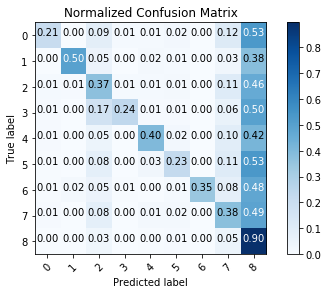

In [44]:
st_time = time()
y_lr, p_lr, r_lr, f_lr = cascade(X_userhist,X_userhist.iloc[:,-1],[],LogisticRegression,param_grid=param_grid_lr)
print("Runtime: {0:0.3f} seconds".format(time() - st_time))


Tuned hyperparameters:
{'C': 0.48329302385717521, 'penalty': 'l1'}
Accuracy: 0.684


/Users/kevinlimkrailassiri/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Tuned hyperparameters:
{'C': 14.384498882876629, 'penalty': 'l2'}
Accuracy: 0.593
             precision    recall  f1-score   support

          0       0.54      0.24      0.34      1051
          1       0.58      0.64      0.61       372
          2       0.51      0.41      0.46      4433
          3       0.57      0.29      0.38       835
          4       0.62      0.45      0.52      1277
          5       0.51      0.30      0.38      1818
          6       0.56      0.42      0.48       166
          7       0.45      0.55      0.49      4710
          8       0.68      0.79      0.73     11876

avg / total       0.59      0.59      0.58     26538

Runtime: 93.339 seconds


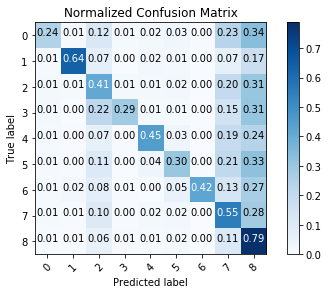

In [45]:
st_time = time()
y_lr_c, p_lr_c, r_lr_c, f_lr_c = cascade(X_userhist,X_userhist.iloc[:,-1],[8],LogisticRegression,param_grid=param_grid_lr)
print("Runtime: {0:0.3f} seconds".format(time() - st_time))


### 4.2 - Gaussian Naive Bayes

Accuracy: 0.601
             precision    recall  f1-score   support

          0       0.44      0.33      0.38       930
          1       0.49      0.70      0.57       318
          2       0.60      0.33      0.42      3988
          3       0.39      0.38      0.38       738
          4       0.56      0.49      0.52      1167
          5       0.46      0.37      0.41      1610
          6       0.42      0.62      0.50       153
          7       0.53      0.37      0.43      4220
          8       0.65      0.85      0.74     11876

avg / total       0.59      0.60      0.58     25000

Runtime: 0.727 seconds


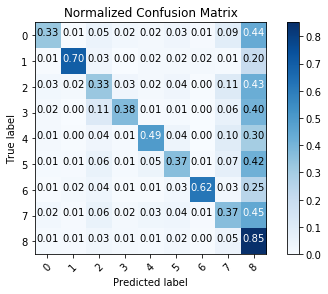

In [46]:
st_time = time()
y_gb, p_gb, r_gb, f_gb = cascade(X_userhist,X_userhist.iloc[:,-1],[],GaussianNB)
print("Runtime: {0:0.3f} seconds".format(time() - st_time))


Accuracy: 0.617


/Users/kevinlimkrailassiri/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Accuracy: 0.584
             precision    recall  f1-score   support

          0       0.47      0.33      0.39      1212
          1       0.53      0.69      0.60       461
          2       0.64      0.34      0.44      5263
          3       0.44      0.39      0.41       969
          4       0.58      0.49      0.53      1509
          5       0.53      0.36      0.43      2163
          6       0.44      0.65      0.53       203
          7       0.49      0.35      0.41      5437
          8       0.62      0.89      0.73     11876

avg / total       0.58      0.58      0.56     29093

Runtime: 0.641 seconds


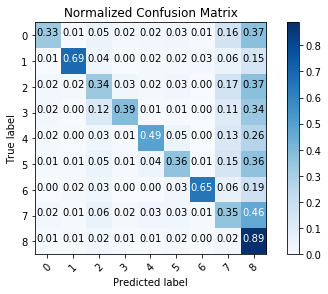

In [47]:
st_time = time()
y_gb_c, p_gb_c, r_gb_c, f_gb_c = cascade(X_userhist,X_userhist.iloc[:,-1],[8],GaussianNB)
print("Runtime: {0:0.3f} seconds".format(time() - st_time))

### 4.3 - k-Nearest Neighbors

In [48]:
param_grid_knn = {
    "n_neighbors" : [45, 55, 60],
    "metric" : ["euclidean", "cityblock"]}

Tuned hyperparameters:
{'metric': 'euclidean', 'n_neighbors': 55}
Accuracy: 0.605
             precision    recall  f1-score   support

          0       0.52      0.27      0.35       930
          1       0.54      0.67      0.60       318
          2       0.55      0.38      0.45      3988
          3       0.54      0.27      0.36       738
          4       0.63      0.43      0.51      1167
          5       0.50      0.27      0.35      1610
          6       0.58      0.42      0.49       153
          7       0.50      0.42      0.46      4220
          8       0.65      0.86      0.74     11876

avg / total       0.59      0.61      0.58     25000

Runtime: 2158.506 seconds


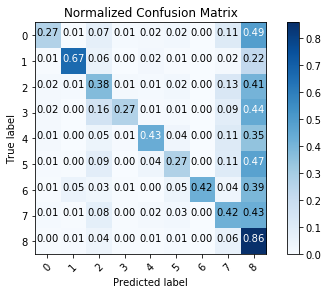

In [49]:
st_time = time()
y_knn, p_knn, r_knn, f_knn = cascade(X_userhist,X_userhist.iloc[:,-1],[],KNeighborsClassifier,param_grid=param_grid_knn)
print("Runtime: {0:0.3f} seconds".format(time() - st_time))

Tuned hyperparameters:
{'metric': 'euclidean', 'n_neighbors': 55}
Accuracy: 0.681


/Users/kevinlimkrailassiri/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Tuned hyperparameters:
{'metric': 'euclidean', 'n_neighbors': 60}
Accuracy: 0.593
             precision    recall  f1-score   support

          0       0.47      0.30      0.37      1054
          1       0.54      0.66      0.59       375
          2       0.52      0.42      0.46      4449
          3       0.51      0.31      0.39       837
          4       0.59      0.48      0.53      1285
          5       0.48      0.34      0.39      1829
          6       0.54      0.43      0.48       167
          7       0.47      0.51      0.49      4736
          8       0.68      0.79      0.73     11876

avg / total       0.58      0.59      0.58     26608

Runtime: 2591.337 seconds


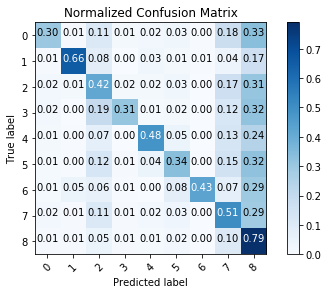

In [50]:
st_time = time()
y_knn_c, p_knn_c, r_knn_c, f_knn_c = cascade(X_userhist,X_userhist.iloc[:,-1],[8],KNeighborsClassifier,param_grid=param_grid_knn)
print("Runtime: {0:0.3f} seconds".format(time() - st_time))

### 4.4 - Random Forests

In [51]:
param_grid_rf = { 
           "n_estimators" : [20, 35, 45],
           "max_depth" : [10, 25, 35],
           "min_samples_leaf" : [15, 40, 50]}


Tuned hyperparameters:
{'max_depth': 35, 'min_samples_leaf': 40, 'n_estimators': 20}
Accuracy: 0.609
             precision    recall  f1-score   support

          0       0.53      0.27      0.36       930
          1       0.56      0.63      0.59       318
          2       0.58      0.35      0.44      3988
          3       0.54      0.27      0.36       738
          4       0.64      0.43      0.52      1167
          5       0.52      0.27      0.36      1610
          6       0.55      0.35      0.42       153
          7       0.50      0.42      0.46      4220
          8       0.64      0.88      0.74     11876

avg / total       0.59      0.61      0.58     25000

Runtime: 230.967 seconds


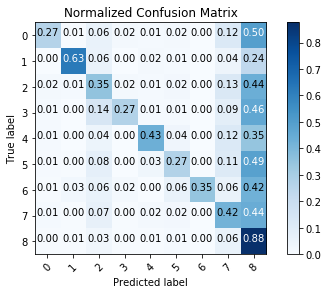

In [52]:
st_time = time()
y_rf, p_rf, r_rf, f_rf = cascade(X_userhist,X_userhist.iloc[:,-1],[],RandomForestClassifier,param_grid=param_grid_rf)
print("Runtime: {0:0.3f} seconds".format(time() - st_time))

Tuned hyperparameters:
{'max_depth': 10, 'min_samples_leaf': 40, 'n_estimators': 45}
Accuracy: 0.685


/Users/kevinlimkrailassiri/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Tuned hyperparameters:
{'max_depth': 25, 'min_samples_leaf': 15, 'n_estimators': 45}
Accuracy: 0.593
             precision    recall  f1-score   support

          0       0.49      0.31      0.38      1042
          1       0.55      0.67      0.61       364
          2       0.52      0.41      0.46      4401
          3       0.50      0.31      0.39       829
          4       0.60      0.48      0.53      1269
          5       0.47      0.35      0.40      1802
          6       0.57      0.37      0.45       165
          7       0.46      0.53      0.49      4647
          8       0.69      0.78      0.73     11876

avg / total       0.58      0.59      0.58     26395

Runtime: 275.689 seconds


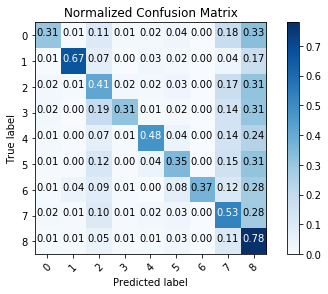

In [53]:
st_time = time()
y_rf_c, p_rf_c, r_rf_c, f_rf_c = cascade(X_userhist,X_userhist.iloc[:,-1],[8],RandomForestClassifier,param_grid=param_grid_rf)
print("Runtime: {0:0.3f} seconds".format(time() - st_time))

### 4.5 - Extreme Gradient Boosting


In [54]:
param_grid_xgb = {
    "learning_rate" : [0.001, 0.01],
    "max_depth" : [5],
    "min_child_weight" : [15, 20, 25],
    "colsample_bytree" : [1],
    "subsample" : [1],
    "gamma" : [0]}

Tuned hyperparameters:
{'colsample_bytree': 1, 'gamma': 0, 'learning_rate': 0.01, 'max_depth': 5, 'min_child_weight': 20, 'subsample': 1}
Accuracy: 0.609
             precision    recall  f1-score   support

          0       0.54      0.26      0.35       930
          1       0.55      0.62      0.58       318
          2       0.59      0.35      0.44      3988
          3       0.56      0.27      0.37       738
          4       0.64      0.42      0.51      1167
          5       0.52      0.28      0.36      1610
          6       0.53      0.33      0.40       153
          7       0.51      0.42      0.46      4220
          8       0.64      0.88      0.74     11876

avg / total       0.59      0.61      0.58     25000

Runtime: 1976.323 seconds


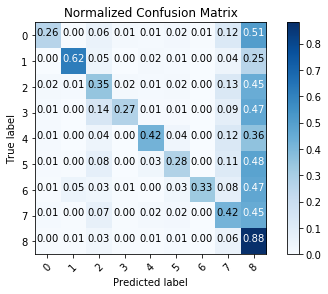

In [55]:
st_time = time()
y_xgb, p_xgb, r_xgb, f_xgb = cascade(X_userhist,X_userhist.iloc[:,-1],[],XGBClassifier,param_grid=param_grid_xgb)
print("Runtime: {0:0.3f} seconds".format(time() - st_time))

Tuned hyperparameters:
{'colsample_bytree': 1, 'gamma': 0, 'learning_rate': 0.001, 'max_depth': 5, 'min_child_weight': 20, 'subsample': 1}
Accuracy: 0.773


/Users/kevinlimkrailassiri/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Tuned hyperparameters:
{'colsample_bytree': 1, 'gamma': 0, 'learning_rate': 0.01, 'max_depth': 5, 'min_child_weight': 15, 'subsample': 1}
Accuracy: 0.534
             precision    recall  f1-score   support

          0       0.49      0.28      0.36       801
          1       0.55      0.65      0.60       287
          2       0.30      0.58      0.39      3526
          3       0.52      0.28      0.37       625
          4       0.61      0.46      0.53      1044
          5       0.46      0.36      0.40      1442
          6       0.57      0.40      0.47       139
          7       0.45      0.50      0.47      3713
          8       0.77      0.59      0.67     11029

avg / total       0.60      0.53      0.55     22606

Runtime: 1186.711 seconds


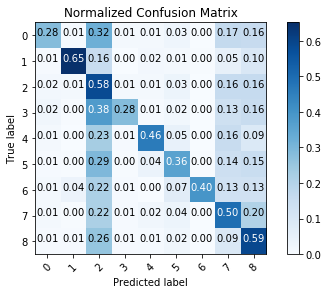

In [56]:
st_time = time()
y_xgb_c, p_xgb_c, r_xgb_c, f_xgb_c = cascade(X_userhist,X_userhist.iloc[:,-1],[8],XGBClassifier,param_grid=param_grid_xgb)
print("Runtime: {0:0.3f} seconds".format(time() - st_time))

### 4.6 - Extremely Randomized Trees


In [57]:
param_grid_ert = { 
           "n_estimators" : [100, 140],
           "max_depth" : [90, 100, 120],
           "min_samples_split" : [80, 120],
           "max_features": ['sqrt']}


Tuned hyperparameters:
{'max_depth': 90, 'max_features': 'sqrt', 'min_samples_split': 120, 'n_estimators': 100}
Accuracy: 0.610
             precision    recall  f1-score   support

          0       0.53      0.26      0.35       930
          1       0.56      0.64      0.60       318
          2       0.58      0.36      0.44      3988
          3       0.59      0.26      0.36       738
          4       0.65      0.43      0.52      1167
          5       0.52      0.28      0.36      1610
          6       0.67      0.37      0.47       153
          7       0.50      0.42      0.46      4220
          8       0.64      0.88      0.74     11876

avg / total       0.60      0.61      0.58     25000

Runtime: 333.221 seconds


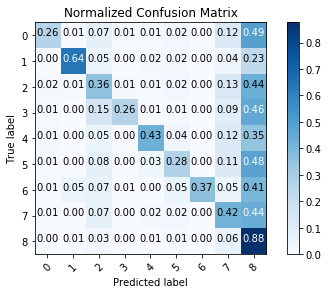

In [58]:
st_time = time()
y_ert, p_ert, r_ert, f_ert = cascade(X_userhist,X_userhist.iloc[:,-1],[],ExtraTreesClassifier,param_grid=param_grid_ert)
print("Runtime: {0:0.3f} seconds".format(time() - st_time))

Tuned hyperparameters:
{'max_depth': 120, 'max_features': 'sqrt', 'min_samples_split': 120, 'n_estimators': 100}
Accuracy: 0.683


/Users/kevinlimkrailassiri/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Tuned hyperparameters:
{'max_depth': 100, 'max_features': 'sqrt', 'min_samples_split': 120, 'n_estimators': 100}
Accuracy: 0.595
             precision    recall  f1-score   support

          0       0.50      0.30      0.38      1053
          1       0.54      0.68      0.60       372
          2       0.52      0.42      0.46      4437
          3       0.53      0.31      0.39       835
          4       0.60      0.47      0.53      1278
          5       0.48      0.34      0.40      1818
          6       0.60      0.46      0.52       167
          7       0.46      0.52      0.49      4712
          8       0.68      0.79      0.73     11876

avg / total       0.59      0.60      0.58     26548

Runtime: 445.056 seconds


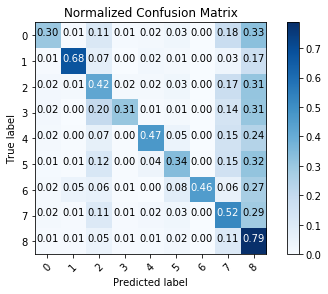

In [59]:
st_time = time()
y_ert_c, p_ert_c, r_ert_c, f_ert_c = cascade(X_userhist,X_userhist.iloc[:,-1],[8],ExtraTreesClassifier,param_grid=param_grid_ert)
print("Runtime: {0:0.3f} seconds".format(time() - st_time))

### 4.7 - Evaluating Performance of Cascaded Classifiers

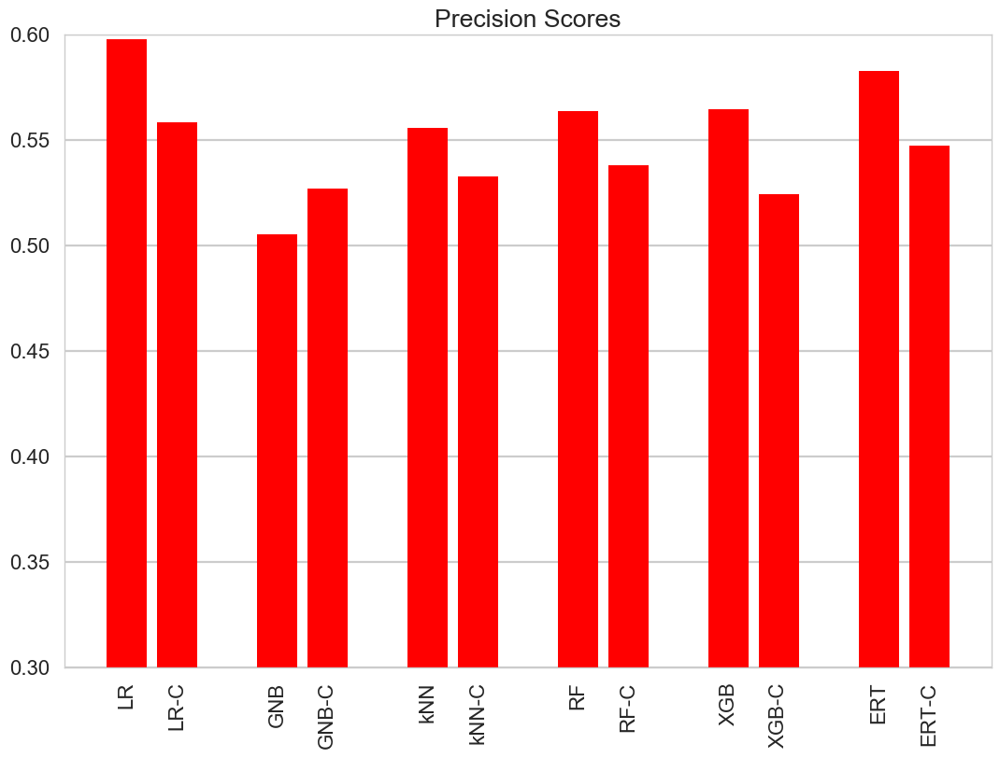

In [60]:
postersettings()

labels = ['LR', 'LR-C', '',
         'GNB', 'GNB-C', '',
         'kNN', 'kNN-C', '',
         'RF', 'RF-C', '',
         'XGB', 'XGB-C', '',
         'ERT', 'ERT-C']

p_scores = [p_lr, p_lr_c, 0, p_gb, p_gb_c, 0, p_knn, p_knn_c, 0, p_rf, p_rf_c, 0,
          p_xgb, p_xgb_c, 0, p_ert, p_ert_c]

r_scores = [r_lr, r_lr_c, 0, r_gb, r_gb_c, 0, r_knn, r_knn_c, 0, r_rf, r_rf_c, 0,
          r_xgb, r_xgb_c, 0, r_ert, r_ert_c]

f1_scores = [f_lr, f_lr_c, 0, f_gb, f_gb_c, 0, f_knn, f_knn_c, 0, f_rf, f_rf_c, 0,
          f_xgb, f_xgb_c, 0, f_ert, f_ert_c]

plt.figure()

plt.bar(range(len(labels)),p_scores, color='red')
plt.xticks(range(len(labels)),labels, rotation=90)
plt.title('Precision Scores')
plt.tick_params(top='off', left='off', right='off')
ax = plt.gca()
ax.grid(False, which='major', axis='x')
ax.set_ylim([0.3,0.6])

plt.show()


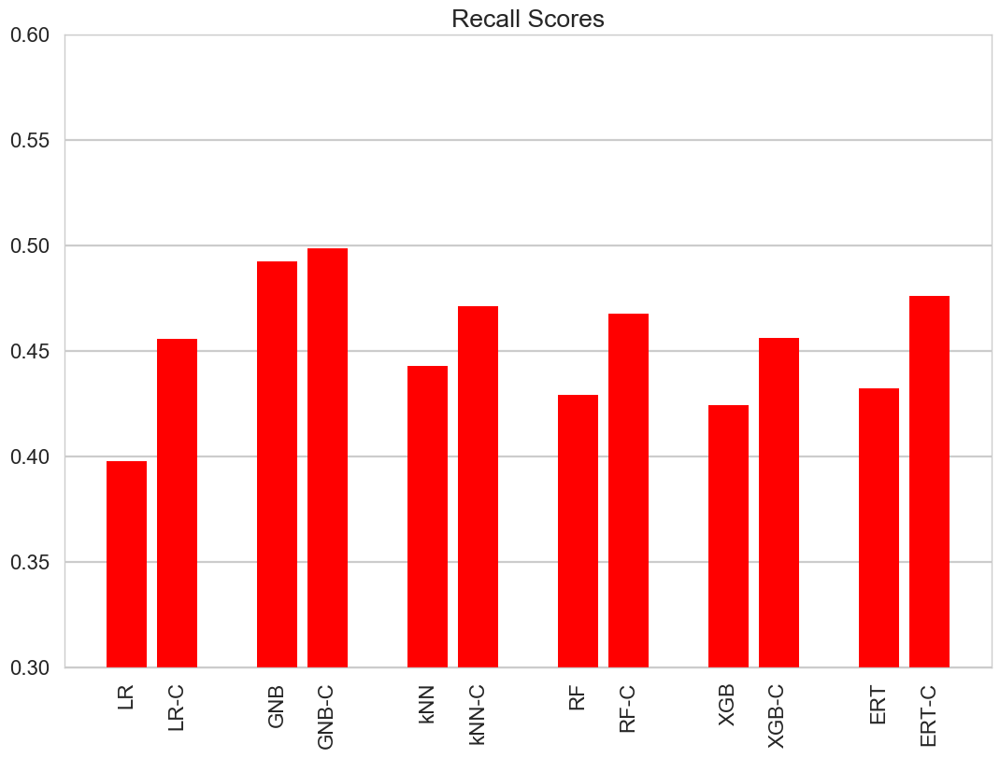

In [61]:
plt.figure()

plt.bar(range(len(labels)),r_scores, color='red')
plt.xticks(range(len(labels)),labels, rotation=90)
plt.title('Recall Scores')
plt.tick_params(top='off', left='off', right='off')
ax2 = plt.gca()
ax2.grid(False, which='major', axis='x')
ax2.set_ylim([0.3,0.6])

plt.show()


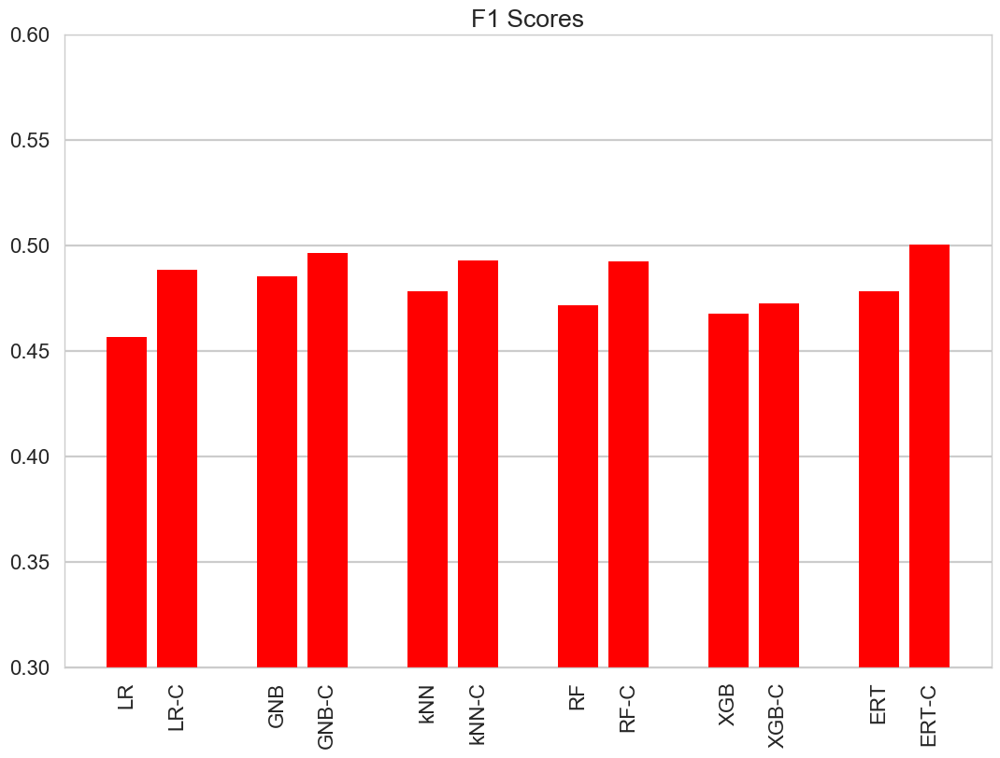

In [62]:
plt.figure()

plt.bar(range(len(labels)),f1_scores, color='red')
plt.xticks(range(len(labels)),labels, rotation=90)
plt.title('F1 Scores')
plt.tick_params(top='off', left='off', right='off')
ax3 = plt.gca()
ax3.grid(False, which='major', axis='x')
ax3.set_ylim([0.3,0.6])

plt.show()